In [9]:
import pandas as pd
import numpy as np

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

## Loading Data

In [11]:
x_train=pd.read_csv('X_train.csv',index_col=0)
x_test=pd.read_csv('X_test.csv',index_col=0)
y_train=pd.read_csv('Y_train.csv',index_col=0)
y_test=pd.read_csv('Y_test.csv',index_col=0)

In [12]:
x_train.shape,x_test.shape

((373028, 280), (93257, 275))

In [7]:
x_train=x_train.loc[:,~x_train.columns.duplicated()]

## Missed some variable categorisation in last section
### I will do that here and all to the x_train,y_train

Remaining fields:
purpose,
mths sinsce earliest credit line,
delinq_2yrs,
inq_last 6 mnths,
open acc,
pub rec,
total acc,
acc_now delinq,
total amnt hi limit

In [18]:
def woe_discrete(df,discrete_variable_name,default_nondefault_variable_df):
  df=pd.concat([df[discrete_variable_name],default_nondefault_variable_df],axis=1)
  df=pd.concat([df.groupby(df.columns.values[0],as_index=False)[df.columns.values[1]].count(),
              df.groupby(df.columns.values[0],as_index=False)[df.columns.values[1]].mean()],axis=1)
  df=df.iloc[:,[0,1,3]]
  df.columns=[df.columns.values[0],'no_obsv','%_nondefault']
  df['non_default']=df['%_nondefault']*df['no_obsv']
  df['default']=(1-df['%_nondefault'])*df['no_obsv']
  df['prop_nondefault']=df['non_default']/df['non_default'].sum()
  df['prop_default']=df['default']/df['default'].sum()
  df['WoE']=np.log(df['prop_nondefault']/df['prop_default'])
  df=df.sort_values(['WoE'])
  df=df.reset_index(drop=True)
  df['IV']=(df['prop_nondefault']-df['prop_default'])*df['WoE']
  df['IV']=df['IV'].sum()
  return df

In [20]:
def plot_by_woe(df_woe,rotation_of_x_axis_label=0):
  x=np.array(df_woe.iloc[:,0].apply(str))
  y=df_woe['WoE']
  plt.figure(figsize=(16,8))
  plt.plot(x,y,marker='o',linestyle='--',color='k')
  plt.xlabel(df_woe.columns[0])
  plt.ylabel('Weight of Evidence')
  plt.title(['Weight of Evidence by '+ df_woe.columns[0]])
  plt.xticks(rotation=rotation_of_x_axis_label)

In [21]:
def woe_ordered_continuous(df,discrete_variable_name,default_nondefault_variable_df):
  df=pd.concat([df[discrete_variable_name],default_nondefault_variable_df],axis=1)
  df=pd.concat([df.groupby(df.columns.values[0],as_index=False)[df.columns.values[1]].count(),
              df.groupby(df.columns.values[0],as_index=False)[df.columns.values[1]].mean()],axis=1)
  df=df.iloc[:,[0,1,3]]
  df.columns=[df.columns.values[0],'no_obsv','%_nondefault']
  df['non_default']=df['%_nondefault']*df['no_obsv']
  df['default']=(1-df['%_nondefault'])*df['no_obsv']
  df['prop_nondefault']=df['non_default']/df['non_default'].sum()
  df['prop_default']=df['default']/df['default'].sum()
  df['WoE']=np.log(df['prop_nondefault']/df['prop_default'])
  #df=df.sort_values(['WoE'])
  #df=df.reset_index(drop=True)
  df['IV']=(df['prop_nondefault']-df['prop_default'])*df['WoE']
  df['IV']=df['IV'].sum()
  return df

In [13]:
new_train=x_train

In [24]:
df_temp=woe_discrete(new_train,'purpose',y_train)
df_temp

,purpose,no_obsv,%_nondefault,non_default,default,prop_nondefault,prop_default,WoE,IV
0,small_business,5582,0.786098,4388.0,1194.0,0.013207,0.029280,-0.796180,0.035418
1,educational,333,0.801802,267.0,66.0,0.000804,0.001619,-0.700151,0.035418
2,moving,2392,0.839465,2008.0,384.0,0.006044,0.009417,-0.443493,0.035418
3,house,1830,0.860109,1574.0,256.0,0.004737,0.006278,-0.281547,0.035418
4,other,18884,0.862264,16283.0,2601.0,0.049008,0.063784,-0.263519,0.035418
5,renewable_energy,281,0.864769,243.0,38.0,0.000731,0.000932,-0.242270,0.035418
6,medical,3684,0.868350,3199.0,485.0,0.009628,0.011894,-0.211300,0.035418
7,wedding,1887,0.881823,1664.0,223.0,0.005008,0.005469,-0.087937,0.035418
8,vacation,1991,0.882471,1757.0,234.0,0.005288,0.005738,-0.081703,0.035418
9,debt_consolidation,219183,0.886884,194390.0,24793.0,0.585071,0.607999,-0.038440,0.035418


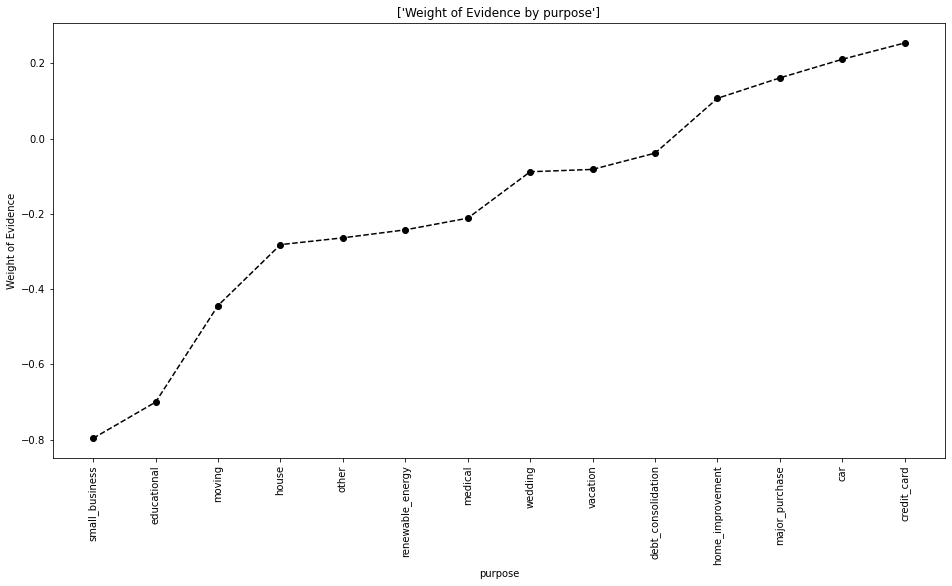

In [26]:
plot_by_woe(df_temp,90)

In [14]:
new_train['purpose:educ__sm_b__wedd__ren_en__mov__house'] = sum([new_train['purpose:educational'], new_train['purpose:small_business'],
                                                                 new_train['purpose:wedding'], new_train['purpose:renewable_energy'],
                                                                 new_train['purpose:moving'], new_train['purpose:house']])
new_train['purpose:oth__med__vacation'] = sum([new_train['purpose:other'], new_train['purpose:medical'],
                                             new_train['purpose:vacation']])
new_train['purpose:major_purch__car__home_impr'] = sum([new_train['purpose:major_purchase'], new_train['purpose:car'],
                                                        new_train['purpose:home_improvement']])

In [31]:
new_train_temp=new_train.loc[new_train['delinq_2yrs']<4,]
new_train_temp['delinq_2yrs_factor']=pd.cut(new_train_temp['delinq_2yrs'],50)
df_temp=woe_ordered_continuous(new_train_temp,'delinq_2yrs_factor',y_train)
df_temp

c:\users\rhitc\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,delinq_2yrs_factor,no_obsv,%_nondefault,non_default,default,prop_nondefault,prop_default,WoE,IV
0,"(-0.003, 0.06]",306417,0.890499,272864.0,33553.0,0.830191,0.831838,-0.001981,0.000168
1,"(0.06, 0.12]",0,NaN,NaN,NaN,NaN,NaN,NaN,0.000168
2,"(0.12, 0.18]",0,NaN,NaN,NaN,NaN,NaN,NaN,0.000168
3,"(0.18, 0.24]",0,NaN,NaN,NaN,NaN,NaN,NaN,0.000168
4,"(0.24, 0.3]",0,NaN,NaN,NaN,NaN,NaN,NaN,0.000168
5,"(0.3, 0.36]",0,NaN,NaN,NaN,NaN,NaN,NaN,0.000168
6,"(0.36, 0.42]",0,NaN,NaN,NaN,NaN,NaN,NaN,0.000168
7,"(0.42, 0.48]",0,NaN,NaN,NaN,NaN,NaN,NaN,0.000168
8,"(0.48, 0.54]",0,NaN,NaN,NaN,NaN,NaN,NaN,0.000168
9,"(0.54, 0.6]",0,NaN,NaN,NaN,NaN,NaN,NaN,0.000168


In [15]:
new_train['delinq_2yrs:<=0.96']=np.where(new_train['delinq_2yrs']<=0.96,1,0)
new_train['delinq_2yrs:0.96-1.98']=np.where((new_train['delinq_2yrs']>0.96) & (new_train['delinq_2yrs']<=1.98),1,0)
new_train['delinq_2yrs:1.98-2.94']=np.where((new_train['delinq_2yrs']>1.98) & (new_train['delinq_2yrs']<=2.94),1,0)
new_train['delinq_2yrs:2.94-4']=np.where((new_train['delinq_2yrs']>2.94) & (new_train['delinq_2yrs']<=4),1,0)
new_train['delinq_2yrs:>4']=np.where(new_train['delinq_2yrs']>4,1,0)

In [36]:
new_train_temp=new_train.loc[new_train['inq_last_6mths']<=6,]
new_train_temp['inq_last_6mths_factor']=pd.cut(new_train_temp['inq_last_6mths'],50)
df_temp=woe_ordered_continuous(new_train_temp,'inq_last_6mths_factor',y_train)
df_temp

c:\users\rhitc\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,inq_last_6mths_factor,no_obsv,%_nondefault,non_default,default,prop_nondefault,prop_default,WoE,IV
0,"(-0.006, 0.12]",193232,0.908395,175531.0,17701.0,0.528703,0.435449,0.194049,0.047217
1,"(0.12, 0.24]",0,NaN,NaN,NaN,NaN,NaN,NaN,0.047217
2,"(0.24, 0.36]",0,NaN,NaN,NaN,NaN,NaN,NaN,0.047217
3,"(0.36, 0.48]",0,NaN,NaN,NaN,NaN,NaN,NaN,0.047217
4,"(0.48, 0.6]",0,NaN,NaN,NaN,NaN,NaN,NaN,0.047217
5,"(0.6, 0.72]",0,NaN,NaN,NaN,NaN,NaN,NaN,0.047217
6,"(0.72, 0.84]",0,NaN,NaN,NaN,NaN,NaN,NaN,0.047217
7,"(0.84, 0.96]",0,NaN,NaN,NaN,NaN,NaN,NaN,0.047217
8,"(0.96, 1.08]",104163,0.884950,92179.0,11984.0,0.277645,0.294809,-0.059985,0.047217
9,"(1.08, 1.2]",0,NaN,NaN,NaN,NaN,NaN,NaN,0.047217


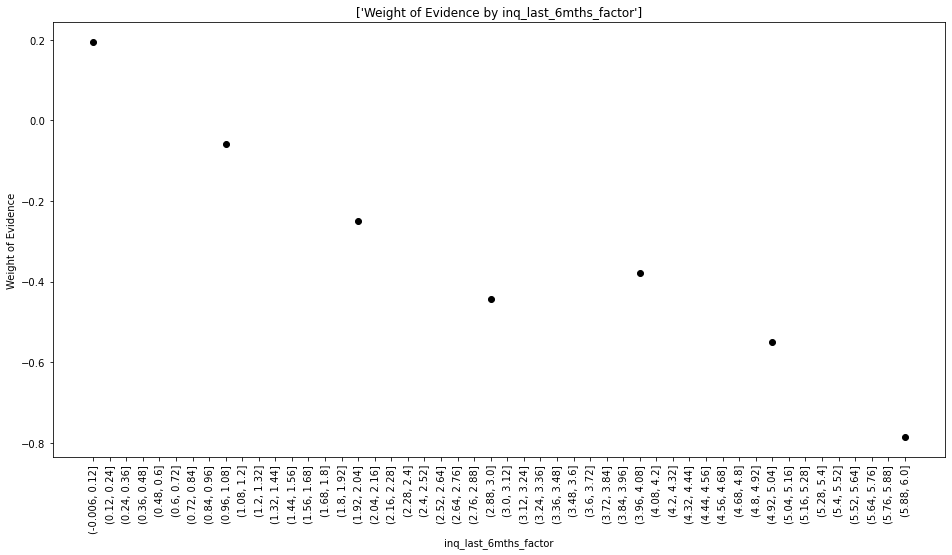

In [38]:
plot_by_woe(df_temp,90)

In [16]:
new_train['inq_last_6mths:<=0.96']=np.where(new_train['inq_last_6mths']<=0.96,1,0)
new_train['inq_last_6mths:0.96-1.92']=np.where((new_train['inq_last_6mths']>0.96) & (new_train['inq_last_6mths']<=1.92),1,0)
new_train['inq_last_6mths:1.92-2.88']=np.where((new_train['inq_last_6mths']>1.92) & (new_train['inq_last_6mths']<=2.88),1,0)
new_train['inq_last_6mths:2.88-3.96']=np.where((new_train['inq_last_6mths']>2.88) & (new_train['inq_last_6mths']<=3.96),1,0)
new_train['inq_last_6mths:3.96-4.92']=np.where((new_train['inq_last_6mths']>3.96) & (new_train['inq_last_6mths']<=4.92),1,0)
new_train['inq_last_6mths:4.92-6']=np.where((new_train['inq_last_6mths']>4.92) & (new_train['inq_last_6mths']<=6),1,0)
new_train['inq_last_6mths:>6']=np.where(new_train['inq_last_6mths']>6,1,0)

In [41]:
new_train['open_acc_factor']=pd.cut(new_train['open_acc'],50)
df_temp=woe_ordered_continuous(new_train,'open_acc_factor',y_train)
df_temp

c:\users\rhitc\appdata\local\programs\python\python37\lib\site-packages\pandas\core\series.py:679: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,open_acc_factor,no_obsv,%_nondefault,non_default,default,prop_nondefault,prop_default,WoE,IV
0,"(-0.084, 1.68]",139,0.848921,118.0,21.0,0.000355,0.000515,-0.371583,inf
1,"(1.68, 3.36]",5834,0.866644,5056.0,778.0,0.015217,0.019079,-0.226141,inf
2,"(3.36, 5.04]",27169,0.891347,24217.0,2952.0,0.072888,0.072392,0.006827,inf
3,"(5.04, 6.72]",24621,0.892368,21971.0,2650.0,0.066128,0.064986,0.017419,inf
4,"(6.72, 8.4]",63748,0.891275,56817.0,6931.0,0.171007,0.169969,0.006086,inf
5,"(8.4, 10.08]",69187,0.889127,61516.0,7671.0,0.185150,0.188116,-0.015895,inf
6,"(10.08, 11.76]",31372,0.885917,27793.0,3579.0,0.083651,0.087768,-0.048044,inf
7,"(11.76, 13.44]",51591,0.892113,46025.0,5566.0,0.138525,0.136495,0.014763,inf
8,"(13.44, 15.12]",35998,0.890438,32054.0,3944.0,0.096476,0.096719,-0.002518,inf
9,"(15.12, 16.8]",13540,0.893944,12104.0,1436.0,0.036430,0.035215,0.033930,inf


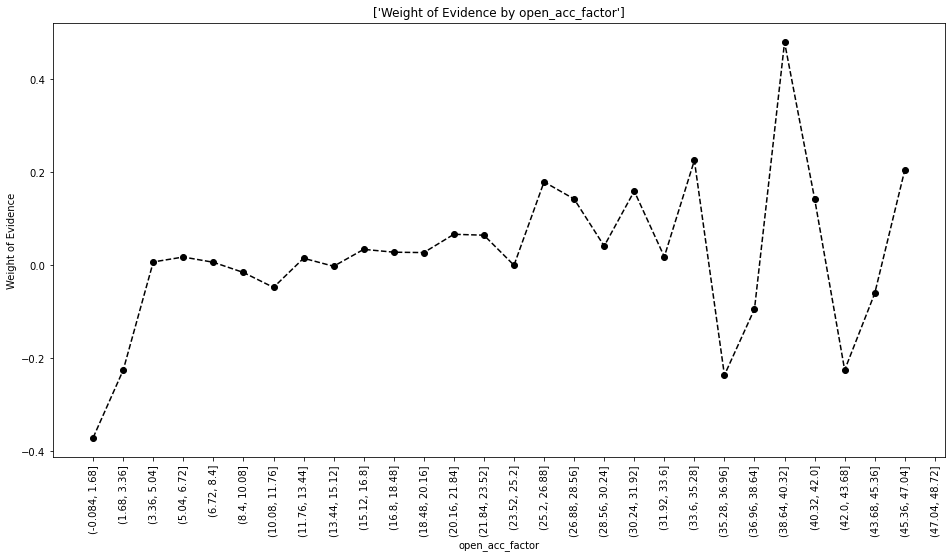

In [42]:
plot_by_woe(df_temp,90)

In [17]:
new_train['open_acc:0']=np.where(new_train['open_acc']==0,1,0)
new_train['open_acc:1-3']=np.where(new_train['open_acc'].isin(range(1,4)),1,0)
new_train['open_acc:4-11']=np.where(new_train['open_acc'].isin(range(4,12)),1,0)
new_train['open_acc:12-23']=np.where(new_train['open_acc'].isin(range(12,24)),1,0)
new_train['open_acc:>23']=np.where(new_train['open_acc']>=24,1,0)

In [46]:
df_temp=woe_ordered_continuous(new_train,'pub_rec',y_train)
df_temp

,pub_rec,no_obsv,%_nondefault,non_default,default,prop_nondefault,prop_default,WoE,IV
0,0.0,323999,0.889941,288340.0,35659.0,0.867840,0.874467,-0.007606,inf
1,1.0,42381,0.893419,37864.0,4517.0,0.113962,0.110771,0.028408,inf
2,2.0,4527,0.903247,4089.0,438.0,0.012307,0.010741,0.136092,inf
3,3.0,1280,0.920312,1178.0,102.0,0.003546,0.002501,0.348856,inf
4,4.0,408,0.924020,377.0,31.0,0.001135,0.000760,0.400513,inf
5,5.0,203,0.911330,185.0,18.0,0.000557,0.000441,0.232239,inf
6,6.0,117,0.931624,109.0,8.0,0.000328,0.000196,0.514161,inf
7,7.0,48,0.958333,46.0,2.0,0.000138,0.000049,1.037749,inf
8,8.0,24,1.000000,24.0,0.0,0.000072,0.000000,inf,inf
9,9.0,14,0.785714,11.0,3.0,0.000033,0.000074,-0.798462,inf


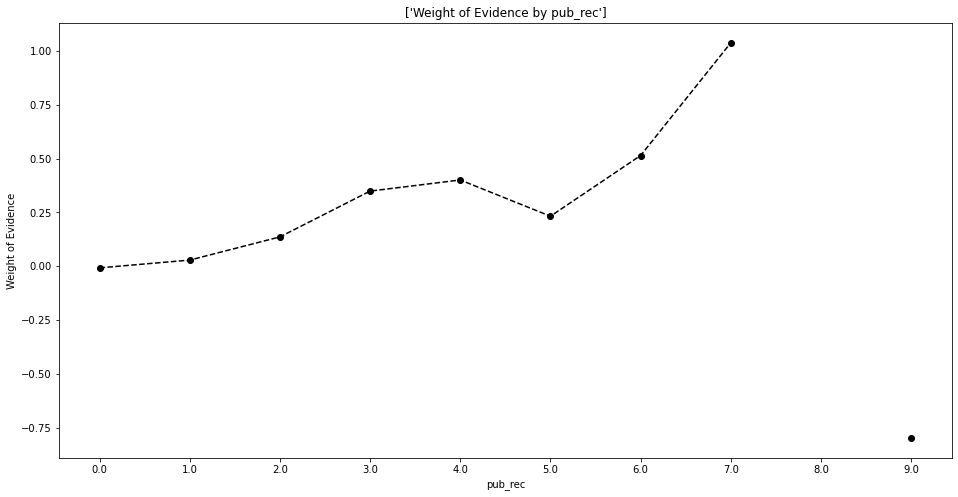

In [47]:
plot_by_woe(df_temp)

In [18]:
new_train['pub_rec:0']=np.where(new_train['pub_rec']==0,1,0)
new_train['pub_rec:1']=np.where(new_train['pub_rec']==1,1,0)
new_train['pub_rec:2']=np.where(new_train['pub_rec']==2,1,0)
new_train['pub_rec:3']=np.where(new_train['pub_rec']==3,1,0)
new_train['pub_rec:>3']=np.where(new_train['pub_rec']>3,1,0)

In [50]:
new_train['total_acc_factor']=pd.cut(new_train['total_acc'],50)
df_temp=woe_ordered_continuous(new_train,'total_acc_factor',y_train)
df_temp

,total_acc_factor,no_obsv,%_nondefault,non_default,default,prop_nondefault,prop_default,WoE,IV
0,"(-0.15, 3.0]",459,0.810458,372.0,87.0,0.001120,0.002134,-0.644759,inf
1,"(3.0, 6.0]",6004,0.864757,5192.0,812.0,0.015627,0.019913,-0.242371,inf
2,"(6.0, 9.0]",15047,0.873131,13138.0,1909.0,0.039543,0.046814,-0.168816,inf
3,"(9.0, 12.0]",25169,0.881283,22181.0,2988.0,0.066760,0.073275,-0.093113,inf
4,"(12.0, 15.0]",33651,0.881281,29656.0,3995.0,0.089258,0.097969,-0.093124,inf
5,"(15.0, 18.0]",38711,0.887267,34347.0,4364.0,0.103377,0.107018,-0.034619,inf
6,"(18.0, 21.0]",40599,0.886155,35977.0,4622.0,0.108283,0.113345,-0.045693,inf
7,"(21.0, 24.0]",40163,0.891492,35805.0,4358.0,0.107765,0.106871,0.008329,inf
8,"(24.0, 27.0]",36286,0.895442,32492.0,3794.0,0.097794,0.093040,0.049828,inf
9,"(27.0, 30.0]",31775,0.899103,28569.0,3206.0,0.085986,0.078621,0.089553,inf


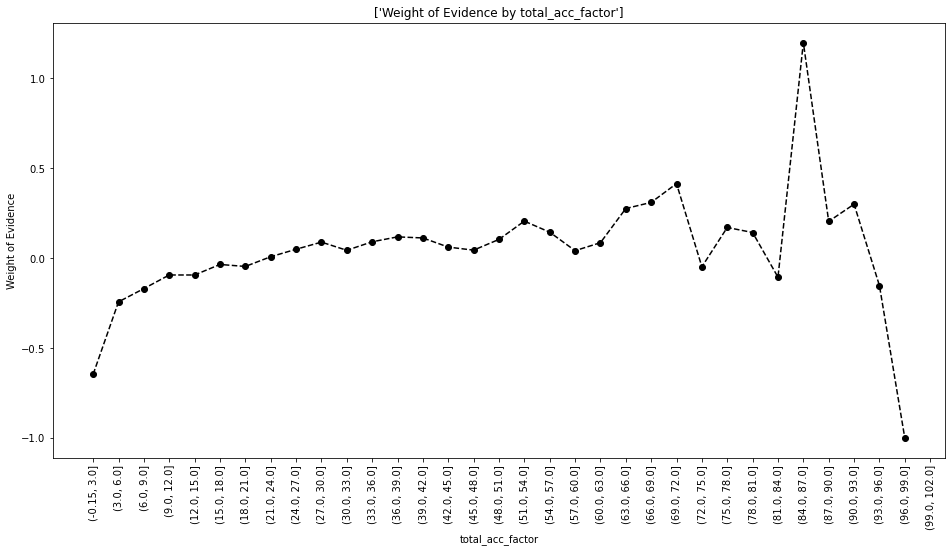

In [51]:
plot_by_woe(df_temp,90)

In [19]:
new_train['total_acc:0']=np.where(new_train['total_acc']==0,1,0)
new_train['total_acc:1-9']=np.where(new_train['total_acc'].isin(range(1,10)),1,0)
new_train['total_acc:10-27']=np.where(new_train['total_acc'].isin(range(10,28)),1,0)
new_train['total_acc:27-54']=np.where(new_train['total_acc'].isin(range(27,55)),1,0)
new_train['total_acc:>55']=np.where(new_train['total_acc']>=55,1,0)

In [56]:
df_temp=woe_ordered_continuous(new_train,'acc_now_delinq',y_train)
df_temp

,acc_now_delinq,no_obsv,%_nondefault,non_default,default,prop_nondefault,prop_default,WoE,IV
0,0.0,371682,0.890648,331038.0,40644.0,0.996352,0.996714,-0.000363,inf
1,1.0,1263,0.899446,1136.0,127.0,0.003419,0.003114,0.093337,inf
2,2.0,70,0.928571,65.0,5.0,0.000196,0.000123,0.467204,inf
3,3.0,7,0.857143,6.0,1.0,0.000018,0.000025,-0.305986,inf
4,4.0,4,1.000000,4.0,0.0,0.000012,0.000000,inf,inf
5,5.0,2,0.500000,1.0,1.0,0.000003,0.000025,-2.097745,inf


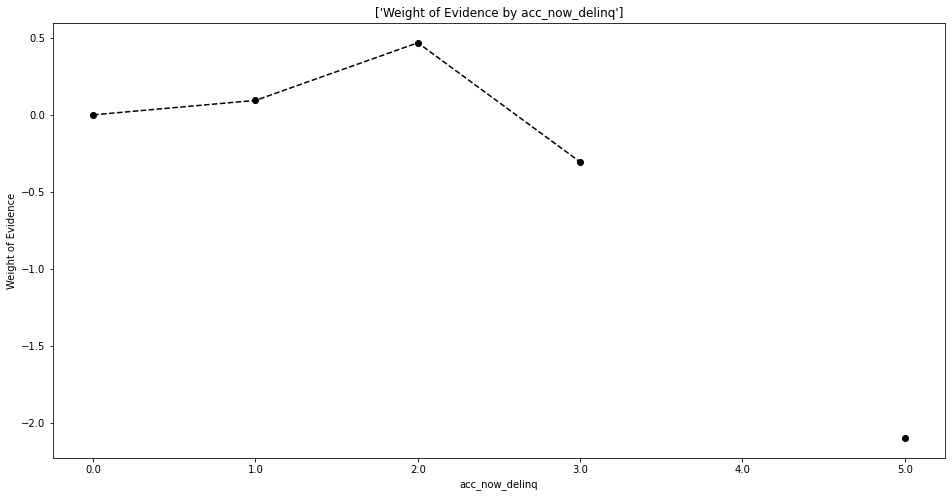

In [57]:
plot_by_woe(df_temp)

In [20]:
new_train['acc_now_delinq:0']=np.where(new_train['acc_now_delinq']==0,1,0)
new_train['acc_now_delinq:>=1']=np.where(new_train['acc_now_delinq']>=1,1,0)

In [63]:
new_train['months_since_credit_Cr_line_factor']=pd.cut(new_train['months_since_credit_Cr_line'],50)
df_temp=woe_ordered_continuous(new_train,'months_since_credit_Cr_line_factor',y_train)
df_temp

,months_since_credit_Cr_line_factor,no_obsv,%_nondefault,non_default,default,prop_nondefault,prop_default,WoE,IV
0,"(-0.887, 17.74]",24,0.875000,21.0,3.0,0.000063,0.000074,-0.151835,inf
1,"(17.74, 35.48]",0,NaN,NaN,NaN,NaN,NaN,NaN,inf
2,"(35.48, 53.22]",0,NaN,NaN,NaN,NaN,NaN,NaN,inf
3,"(53.22, 70.96]",0,NaN,NaN,NaN,NaN,NaN,NaN,inf
4,"(70.96, 88.7]",1815,0.898623,1631.0,184.0,0.004909,0.004512,0.084268,inf
5,"(88.7, 106.44]",3873,0.861606,3337.0,536.0,0.010044,0.013144,-0.269052,inf
6,"(106.44, 124.18]",10048,0.867735,8719.0,1329.0,0.026242,0.032591,-0.216667,inf
7,"(124.18, 141.92]",16745,0.865870,14499.0,2246.0,0.043639,0.055079,-0.232816,inf
8,"(141.92, 159.66]",21889,0.877199,19201.0,2688.0,0.057791,0.065918,-0.131580,inf
9,"(159.66, 177.4]",27877,0.882448,24600.0,3277.0,0.074041,0.080362,-0.081927,inf


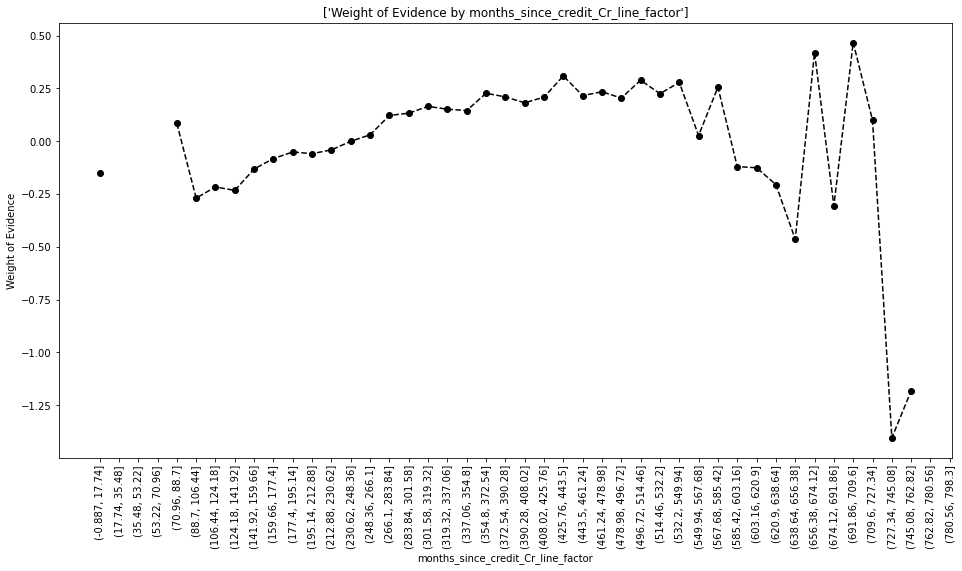

In [64]:
plot_by_woe(df_temp,90)

In [21]:
new_train['months_since_credit_Cr_line:<140']=np.where(new_train['months_since_credit_Cr_line']<140,1,0)
new_train['months_since_credit_Cr_line:140-300']=np.where(new_train['months_since_credit_Cr_line'].isin(range(140,300)),1,0)
new_train['months_since_credit_Cr_line:>300']=np.where(new_train['months_since_credit_Cr_line']>=300,1,0)

In [83]:
new_train_temp=new_train.copy()
new_train_temp=new_train_temp.loc[new_train_temp['total_rev_hi_lim']<200000]
new_train_temp['total_rev_hi_lim_factor']=pd.cut(new_train_temp['total_rev_hi_lim'],50)
df_temp=woe_ordered_continuous(new_train_temp,'total_rev_hi_lim_factor',y_train)
df_temp

,total_rev_hi_lim_factor,no_obsv,%_nondefault,non_default,default,prop_nondefault,prop_default,WoE,IV
0,"(-199.9, 3998.0]",12013,0.862399,10360.0,1653.0,0.031281,0.040588,-0.260462,0.04392
1,"(3998.0, 7996.0]",37732,0.874298,32989.0,4743.0,0.099608,0.116461,-0.156318,0.04392
2,"(7996.0, 11994.0]",46663,0.878062,40973.0,5690.0,0.123715,0.139714,-0.121619,0.04392
3,"(11994.0, 15992.0]",47401,0.879222,41676.0,5725.0,0.125838,0.140574,-0.110740,0.04392
4,"(15992.0, 19990.0]",39288,0.879709,34562.0,4726.0,0.104357,0.116044,-0.106147,0.04392
5,"(19990.0, 23988.0]",33983,0.885472,30091.0,3892.0,0.090857,0.095565,-0.050520,0.04392
6,"(23988.0, 27986.0]",28292,0.886116,25070.0,3222.0,0.075697,0.079114,-0.044153,0.04392
7,"(27986.0, 31984.0]",22175,0.894566,19837.0,2338.0,0.059896,0.057408,0.042431,0.04392
8,"(31984.0, 35982.0]",18948,0.892284,16907.0,2041.0,0.051049,0.050115,0.018465,0.04392
9,"(35982.0, 39980.0]",14556,0.911239,13264.0,1292.0,0.040050,0.031724,0.233040,0.04392


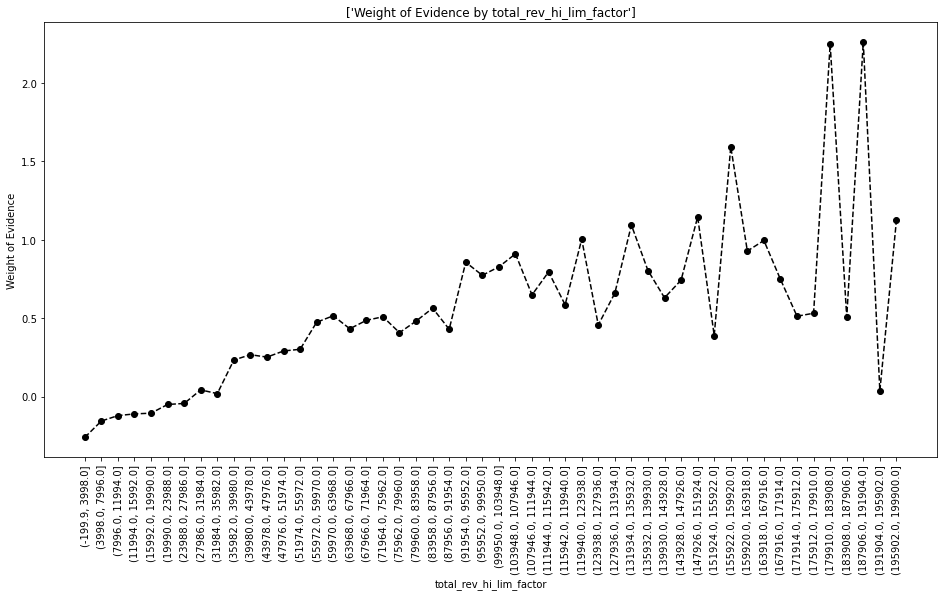

In [84]:
plot_by_woe(df_temp,90)

In [22]:
new_train['total_rev_hi_lim:<=4k']=np.where(new_train['total_rev_hi_lim']<=4000,1,0)
new_train['total_rev_hi_lim:4k-35k']=np.where((new_train['total_rev_hi_lim']>4000) & (new_train['total_rev_hi_lim']<=35000),1,0)
new_train['total_rev_hi_lim:35k-56k']=np.where((new_train['total_rev_hi_lim']>35000) & (new_train['total_rev_hi_lim']<=56000),1,0)
new_train['total_rev_hi_lim:56k-80k']=np.where((new_train['total_rev_hi_lim']>56000) & (new_train['total_rev_hi_lim']<=80000),1,0)
new_train['total_rev_hi_lim:>80k']=np.where(new_train['total_rev_hi_lim']>80000,1,0)

In [23]:
#saving final train file
final_x_train=new_train

In [24]:
final_x_train.shape

(373028, 320)

In [20]:
new_train=x_test

In [32]:
#Saving final test file
final_x_test=new_train

In [33]:
final_x_test.shape

(93257, 315)

### Explore Data

In [110]:
pd.options.display.max_columns=None
final_x_train.head()

,Unnamed: 0.1,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,emp_length_int,term_int,earliest_cr_line_date,months_since_credit_Cr_line,issue_date,months_issue_date,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,sub_grade:A1,sub_grade:A2,sub_grade:A3,sub_grade:A4,sub_grade:A5,sub_grade:B1,sub_grade:B2,sub_grade:B3,sub_grade:B4,sub_grade:B5,sub_grade:C1,sub_grade:C2,sub_grade:C3,sub_grade:C4,sub_grade:C5,sub_grade:D1,sub_grade:D2,sub_grade:D3,sub_grade:D4,sub_grade:D5,sub_grade:E1,sub_grade:E2,sub_grade:E3,sub_grade:E4,sub_grade:E5,sub_grade:F1,sub_grade:F2,sub_grade:F3,sub_grade:F4,sub_grade:F5,sub_grade:G1,sub_grade:G2,sub_grade:G3,sub_grade:G4,sub_grade:G5,home_ownership:ANY,home_ownership:MORTGAGE,home_ownership:NONE,home_ownership:OTHER,home_ownership:OWN,home_ownership:RENT,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,loan_status:Charged Off,loan_status:Current,loan_status:Default,loan_status:Does not meet the credit policy. Status:Charged Off,loan_status:Does not meet the credit policy. Status:Fully Paid,loan_status:Fully Paid,loan_status:In Grace Period,loan_status:Late (16-30 days),loan_status:Late (31-120 days),purpose:car,purpose:credit_card,purpose:debt_consolidation,purpose:educational,purpose:home_improvement,purpose:house,purpose:major_purchase,purpose:medical,purpose:moving,purpose:other,purpose:renewable_energy,purpose:small_business,purpose:vacation,purpose:wedding,addr_state:AK,addr_state:AL,addr_state:AR,addr_state:AZ,addr_state:CA,addr_state:CO,addr_state:CT,addr_state:DC,addr_state:DE,addr_state:FL,addr_state:GA,addr_state:HI,addr_state:IA,addr_state:ID,addr_state:IL,addr_state:IN,addr_state:KS,addr_state:KY,addr_state:LA,addr_state:MA,addr_state:MD,addr_state:ME,addr_state:MI,addr_state:MN,addr_state:MO,addr_state:MS,addr_state:MT,addr_state:NC,addr_state:NE,addr_state:NH,addr_state:NJ,addr_state:NM,addr_state:NV,addr_state:NY,addr_state:OH,addr_state:OK,addr_state:OR,addr_state:PA,addr_state:RI,addr_state:SC,addr_state:SD,addr_state:TN,addr_state:TX,addr_state:UT,addr_state:VA,addr_state:VT,addr_state:WA,addr_state:WI,addr_state:WV,addr_state:WY,initial_list_status:f,initial_list_status:w,homeOwnership_Rent_Other_Any_None,addr_state:ND,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:OK_TN_MO_LA_MD_NC,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,term:36,term:60,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,months_issue_date_factor,months_since_issue_date:<38,months_since_issue_date:38-39,months_since_issue_date:40-41,months_since_issue_date:42-48,months_since_issue_date:49-52,months_since_issue_date:53-64,months_since_issue_date:65-84,months_since_issue_date:>85,int_rate_factor,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,int_rate:>20.281,funded_amnt_factor,annual_inc_factor,annual_inc:<20000,annual_inc:20k-30k,annual_inc:30k-40k,annu

In [111]:
final_x_train.describe()

,Unnamed: 0.1,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,emp_length_int,term_int,months_since_credit_Cr_line,months_issue_date,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,sub_grade:A1,sub_grade:A2,sub_grade:A3,sub_grade:A4,sub_grade:A5,sub_grade:B1,sub_grade:B2,sub_grade:B3,sub_grade:B4,sub_grade:B5,sub_grade:C1,sub_grade:C2,sub_grade:C3,sub_grade:C4,sub_grade:C5,sub_grade:D1,sub_grade:D2,sub_grade:D3,sub_grade:D4,sub_grade:D5,sub_grade:E1,sub_grade:E2,sub_grade:E3,sub_grade:E4,sub_grade:E5,sub_grade:F1,sub_grade:F2,sub_grade:F3,sub_grade:F4,sub_grade:F5,sub_grade:G1,sub_grade:G2,sub_grade:G3,sub_grade:G4,sub_grade:G5,home_ownership:ANY,home_ownership:MORTGAGE,home_ownership:NONE,home_ownership:OTHER,home_ownership:OWN,home_ownership:RENT,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,loan_status:Charged Off,loan_status:Current,loan_status:Default,loan_status:Does not meet the credit policy. Status:Charged Off,loan_status:Does not meet the credit policy. Status:Fully Paid,loan_status:Fully Paid,loan_status:In Grace Period,loan_status:Late (16-30 days),loan_status:Late (31-120 days),purpose:car,purpose:credit_card,purpose:debt_consolidation,purpose:educational,purpose:home_improvement,purpose:house,purpose:major_purchase,purpose:medical,purpose:moving,purpose:other,purpose:renewable_energy,purpose:small_business,purpose:vacation,purpose:wedding,addr_state:AK,addr_state:AL,addr_state:AR,addr_state:AZ,addr_state:CA,addr_state:CO,addr_state:CT,addr_state:DC,addr_state:DE,addr_state:FL,addr_state:GA,addr_state:HI,addr_state:IA,addr_state:ID,addr_state:IL,addr_state:IN,addr_state:KS,addr_state:KY,addr_state:LA,addr_state:MA,addr_state:MD,addr_state:ME,addr_state:MI,addr_state:MN,addr_state:MO,addr_state:MS,addr_state:MT,addr_state:NC,addr_state:NE,addr_state:NH,addr_state:NJ,addr_state:NM,addr_state:NV,addr_state:NY,addr_state:OH,addr_state:OK,addr_state:OR,addr_state:PA,addr_state:RI,addr_state:SC,addr_state:SD,addr_state:TN,addr_state:TX,addr_state:UT,addr_state:VA,addr_state:VT,addr_state:WA,addr_state:WI,addr_state:WV,addr_state:WY,initial_list_status:f,initial_list_status:w,homeOwnership_Rent_Other_Any_None,addr_state:ND,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:OK_TN_MO_LA_MD_NC,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,term:36,term:60,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,months_since_issue_date:<38,months_since_issue_date:38-39,months_since_issue_date:40-41,months_since_issue_date:42-48,months_since_issue_date:49-52,months_since_issue_date:53-64,months_since_issue_date:65-84,months_since_issue_date:>85,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,int_rate:>20.281,annual_inc:<20000,annual_inc:20k-30k,annual_inc:30k-40k,annual_inc:40k-50k,annual_inc:50k-60k,annual_inc:60k-70k,annual_inc:70k-80k,annual_inc:80k-90k,annual_inc:90k-100k,annual_inc:100k-120k,annual_inc:120k-140k,annual_inc:>140k,mths_since_last_delinq:Null,mths_since_last_delinq:0-3,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,dti:<1.4,dti:1.4-3.5,dti:3.5-7.7,dti:7.7-10.5,dti:1

In [112]:
final_x_train.columns.values

array(['Unnamed: 0.1', 'id', 'member_id', 'loan_amnt', 'funded_amnt',
       'funded_amnt_inv', 'term', 'int_rate', 'installment', 'grade',
       'sub_grade', 'emp_title', 'emp_length', 'home_ownership',
       'annual_inc', 'verification_status', 'issue_d', 'loan_status',
       'pymnt_plan', 'url', 'desc', 'purpose', 'title', 'zip_code',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'initial_list_status', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee',
       'recoveries', 'collection_recovery_fee', 'last_pymnt_d',
       'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d',
       'collections_12_mths_ex_med', 'mths_since_last_major_derog',
       'policy_code', 'application_type', 'annual_inc_joint', 'dti_joint',
       've

In [113]:
pd.options.display.max_columns=100

In [114]:
y_train.head()

,default/not_default
427211,1
206088,1
136020,1
412305,0
36159,0


In [34]:
final_x_train.shape

(373028, 320)

In [25]:
y_train.shape

(373028, 1)

In [36]:
final_x_test.shape

(93257, 315)

In [124]:
y_test.shape

(93257, 1)

## Selecting the Features

In [26]:
cat=['grade:A',
'grade:B',
'grade:C',
'grade:D',
'grade:E',
'grade:F',
'grade:G',
'homeOwnership_Rent_Other_Any_None',
'home_ownership:OWN',
'home_ownership:MORTGAGE',
'addr_state:ND_NE_IA_NV_FL_HI_AL',
'addr_state:NM_VA',
'addr_state:UT_KY_AZ_NJ',
'addr_state:RI_MA_DE_SD_IN',
'addr_state:WI_MT',
'addr_state:KS_SC_CO_VT_AK_MS',
'addr_state:AR_MI_PA_OH_MN',
'addr_state:GA_WA_OR',
'addr_state:OK_TN_MO_LA_MD_NC',
'addr_state:IL_CT',
'addr_state:WV_NH_WY_DC_ME_ID',
'term:36',
'term:60',
'emp_length:0',
'emp_length:1',
'emp_length:2-4',
'emp_length:5-6',
'emp_length:7-9',
'emp_length:10',
'months_since_issue_date:<38',
'months_since_issue_date:38-39',
'months_since_issue_date:40-41',
'months_since_issue_date:42-48',
'months_since_issue_date:49-52',
'months_since_issue_date:53-64',
'months_since_issue_date:65-84',
'months_since_issue_date:>85',
'int_rate:<9.548',
'int_rate:9.548-12.025',
'int_rate:12.025-15.74',
'int_rate:15.74-20.281',
'int_rate:>20.281',
'annual_inc:<20000',
'annual_inc:20k-30k',
'annual_inc:30k-40k',
'annual_inc:40k-50k',
'annual_inc:50k-60k',
'annual_inc:60k-70k',
'annual_inc:70k-80k',
'annual_inc:80k-90k',
'annual_inc:90k-100k',
'annual_inc:100k-120k',
'annual_inc:120k-140k',
'annual_inc:>140k',
'mths_since_last_delinq:Null',
'mths_since_last_delinq:0-3',
'mths_since_last_delinq:4-30',
'mths_since_last_delinq:31-56',
'mths_since_last_delinq:>=57',
'dti:<1.4',
'dti:1.4-3.5',
'dti:3.5-7.7',
'dti:7.7-10.5',
'dti:10.5-16.1',
'dti:16.1-20.3',
'dti:20.3-21.7',
'dti:21.7-22.4',
'dti:22.4-35',
'dti:>35',
'mths_since_last_record:Null',
'mths_since_last_record:0-2',
'mths_since_last_record:3-20',
'mths_since_last_record:21-31',
'mths_since_last_record:32-80',
'mths_since_last_record:81-86',
'mths_since_last_record:>=87',
'verification_status:Not Verified',
'verification_status:Source Verified',
'verification_status:Verified',
'initial_list_status:f',
'initial_list_status:w',
'purpose:educ__sm_b__wedd__ren_en__mov__house',
'purpose:oth__med__vacation',
'purpose:major_purch__car__home_impr',
'delinq_2yrs:<=0.96',
'delinq_2yrs:0.96-1.98',
'delinq_2yrs:1.98-2.94',
'delinq_2yrs:2.94-4',
'delinq_2yrs:>4',
'inq_last_6mths:<=0.96',
'inq_last_6mths:0.96-1.92',
'inq_last_6mths:1.92-2.88',
'inq_last_6mths:2.88-3.96',
'inq_last_6mths:3.96-4.92',
'inq_last_6mths:4.92-6',
'inq_last_6mths:>6',
'open_acc:0',
'open_acc:1-3',
'open_acc:4-11',
'open_acc:12-23',
'open_acc:>23',
'pub_rec:0',
'pub_rec:1',
'pub_rec:2',
'pub_rec:3',
'pub_rec:>3',
'total_acc:0',
'total_acc:1-9',
'total_acc:10-27',
'total_acc:27-54',
'total_acc:>55',
'acc_now_delinq:0',
'acc_now_delinq:>=1',
'months_since_credit_Cr_line:<140',
'months_since_credit_Cr_line:140-300',
'months_since_credit_Cr_line:>300',
'total_rev_hi_lim:<=4k',
'total_rev_hi_lim:4k-35k',
'total_rev_hi_lim:35k-56k',
'total_rev_hi_lim:56k-80k',
'total_rev_hi_lim:>80k']

In [27]:
input_train_with_ref_cat=final_x_train.loc[:,cat]

In [28]:
re_cat=['grade:G',
'homeOwnership_Rent_Other_Any_None',
'addr_state:ND_NE_IA_NV_FL_HI_AL',
'verification_status:Verified',
'initial_list_status:f',
'term:60',
'emp_length:0',
'months_since_issue_date:>85',
'int_rate:>20.281',
'annual_inc:<20000',
'dti:>35',
'mths_since_last_delinq:0-3',
'mths_since_last_record:0-2',
'purpose:educ__sm_b__wedd__ren_en__mov__house',
'delinq_2yrs:>4',
'inq_last_6mths:>6',
'open_acc:0',
'pub_rec:0',
'total_acc:10-27',
'acc_now_delinq:0',
'months_since_credit_Cr_line:<140',
'total_rev_hi_lim:<=4k']

In [29]:
inputs_train=input_train_with_ref_cat.drop(re_cat,axis=1)

In [171]:
inputs_train.columns.values

array(['grade:A', 'grade:B', 'grade:C', 'grade:D', 'grade:E', 'grade:F',
       'home_ownership:OWN', 'home_ownership:MORTGAGE',
       'addr_state:NM_VA', 'addr_state:UT_KY_AZ_NJ',
       'addr_state:RI_MA_DE_SD_IN', 'addr_state:WI_MT',
       'addr_state:KS_SC_CO_VT_AK_MS', 'addr_state:AR_MI_PA_OH_MN',
       'addr_state:GA_WA_OR', 'addr_state:OK_TN_MO_LA_MD_NC',
       'addr_state:IL_CT', 'addr_state:WV_NH_WY_DC_ME_ID', 'term:36',
       'emp_length:1', 'emp_length:2-4', 'emp_length:5-6',
       'emp_length:7-9', 'emp_length:10', 'months_since_issue_date:<38',
       'months_since_issue_date:38-39', 'months_since_issue_date:40-41',
       'months_since_issue_date:42-48', 'months_since_issue_date:49-52',
       'months_since_issue_date:53-64', 'months_since_issue_date:65-84',
       'int_rate:<9.548', 'int_rate:9.548-12.025',
       'int_rate:12.025-15.74', 'int_rate:15.74-20.281',
       'annual_inc:20k-30k', 'annual_inc:30k-40k', 'annual_inc:40k-50k',
       'annual_inc:50k-60k', '

In [172]:
inputs_train.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:NM_VA,addr_state:UT_KY_AZ_NJ,addr_state:RI_MA_DE_SD_IN,addr_state:WI_MT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:AR_MI_PA_OH_MN,addr_state:GA_WA_OR,addr_state:OK_TN_MO_LA_MD_NC,addr_state:IL_CT,addr_state:WV_NH_WY_DC_ME_ID,term:36,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,months_since_issue_date:<38,months_since_issue_date:38-39,months_since_issue_date:40-41,months_since_issue_date:42-48,months_since_issue_date:49-52,months_since_issue_date:53-64,months_since_issue_date:65-84,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,annual_inc:20k-30k,annual_inc:30k-40k,annual_inc:40k-50k,annual_inc:50k-60k,annual_inc:60k-70k,annual_inc:70k-80k,annual_inc:80k-90k,annual_inc:90k-100k,annual_inc:100k-120k,annual_inc:120k-140k,annual_inc:>140k,mths_since_last_delinq:Null,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,dti:<1.4,dti:1.4-3.5,dti:3.5-7.7,dti:7.7-10.5,dti:10.5-16.1,dti:16.1-20.3,dti:20.3-21.7,dti:21.7-22.4,dti:22.4-35,mths_since_last_record:Null,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=87,verification_status:Not Verified,verification_status:Source Verified,initial_list_status:w,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,delinq_2yrs:<=0.96,delinq_2yrs:0.96-1.98,delinq_2yrs:1.98-2.94,delinq_2yrs:2.94-4,inq_last_6mths:<=0.96,inq_last_6mths:0.96-1.92,inq_last_6mths:1.92-2.88,inq_last_6mths:2.88-3.96,inq_last_6mths:3.96-4.92,inq_last_6mths:4.92-6,open_acc:1-3,open_acc:4-11,open_acc:12-23,open_acc:>23,pub_rec:1,pub_rec:2,pub_rec:3,pub_rec:>3,total_acc:0,total_acc:1-9,total_acc:27-54,total_acc:>55,acc_now_delinq:>=1,months_since_credit_Cr_line:140-300,months_since_credit_Cr_line:>300,total_rev_hi_lim:4k-35k,total_rev_hi_lim:35k-56k,total_rev_hi_lim:56k-80k,total_rev_hi_lim:>80k
427211,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0
206088,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0
136020,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
412305,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0
36159,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0


In [173]:
inputs_train.shape

(373028, 99)

# Fitting Model

In [30]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

In [31]:
reg=LogisticRegression()

In [176]:
pd.options.display.max_rows=None

In [32]:
reg.fit(inputs_train,y_train)

c:\users\rhitc\appdata\local\programs\python\python37\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
c:\users\rhitc\appdata\local\programs\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression()

In [33]:
reg.coef_

array([[ 1.14983057,  0.92112347,  0.7209702 ,  0.52745213,  0.34645601,
         0.15165532,  0.10365496,  0.1194883 , -0.03640625,  0.00566131,
         0.03086924,  0.17468655,  0.2497122 ,  0.06683379,  0.11085045,
        -0.01450725,  0.1949525 ,  0.4604809 ,  0.07587939,  0.09774981,
         0.12079399,  0.08472592,  0.0552273 ,  0.12354872,  1.07426754,
         0.87703743,  0.77950829,  0.58028869,  0.41713551,  0.17075559,
        -0.07010325,  0.90188753,  0.56179421,  0.30894376,  0.11351988,
        -0.06153828,  0.00971789,  0.1107912 ,  0.18107108,  0.25679331,
         0.33178977,  0.4105984 ,  0.42833216,  0.50910112,  0.59870268,
         0.53278689,  0.0526665 ,  0.13208084,  0.13914064,  0.09087263,
         0.16057685,  0.30685661,  0.35582404,  0.30413651,  0.23556331,
         0.14293875,  0.13487929,  0.10455826,  0.06343882,  0.4138219 ,
         0.30176607,  0.23477939,  0.39592094,  0.05884566,  0.11729227,
         0.09039098, -0.01138008,  0.0545812 ,  0.0

In [34]:
reg.intercept_

array([-1.23448697])

In [36]:
import pickle
pickle.dump(reg,open('pd_reg.sav','wb'))

In [180]:
feature_name=inputs_train.columns.values
summary_table=pd.DataFrame(columns=['Feature name'],data=feature_name)
summary_table['Coefficients']=np.transpose(reg.coef_)
summary_table.index=summary_table.index+1
summary_table.loc[0]=['Intercept',reg.intercept_[0]]
summary_table=summary_table.sort_index()
summary_table

,Feature name,Coefficients
0,Intercept,-1.234487
1,grade:A,1.149831
2,grade:B,0.921123
3,grade:C,0.720970
4,grade:D,0.527452
5,grade:E,0.346456
6,grade:F,0.151655
7,home_ownership:OWN,0.103655
8,home_ownership:MORTGAGE,0.119488
9,addr_state:NM_VA,-0.036406


# Variable importance -P value

In [190]:
# from sklearn import linear_model
# import scipy.stats as stats

# class Logistic_regression_with_p_values:
    
#     def __init__(self,*args,**kwargs):
#         self.model=linear_model.LogisticRegression(*args,**kwargs)
        
#     def fit(self,x,y):
#         self.model.fit(x,y)
#         denom=(2.0 * (1.0 + np.cosh(self.model.decision_function(x))))
#         denom=np.tile(denom,(x.shape[1],1)).T
#         F_ij=np.dot((x/denom).T,x)
#         Cramer_Rao=np.linalg.inv(F_ij)
#         sigma_estimates=np.sqrt(np.diagonal(Cramer_Rao))
#         z_score=self.model.coef_[0]/sigma_estimates
#         p_value=[stats.norm.sf(abs(x))*2 for x in z_score]
#         self.coef_=self.model.coef_
#         self.intercept_=self.model.intercept_
#         self.p_values=p_value

In [192]:
# reg=Logistic_regression_with_p_values()
# reg.fit(inputs_train,y_train)

In [196]:
# import sys
# !{sys.executable} -m pip install statsmodels

  Using cached patsy-0.5.1-py2.py3-none-any.whl (231 kB)


In [200]:
# import statsmodels.api as sm
# logit_model=sm.Logit(y_train,inputs_train)
# result=logit_model.fit()
# print(result.summary())

Optimization terminated successfully.
         Current function value: 0.320865
         Iterations 7


LinAlgError: Singular matrix

# Validation

In [181]:
input_test_with_ref_cat=final_x_test.loc[:,cat]

In [182]:
inputs_test=input_test_with_ref_cat.drop(re_cat,axis=1)

In [183]:
inputs_test.shape

(93257, 99)

In [184]:
y_hat_test=reg.predict(inputs_test)

In [185]:
y_hat_test

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

In [186]:
y_hat_test_prob=reg.predict_proba(inputs_test)
y_hat_test_prob

array([[0.07388502, 0.92611498],
       [0.16129004, 0.83870996],
       [0.1107013 , 0.8892987 ],
       ...,
       [0.02538833, 0.97461167],
       [0.04028041, 0.95971959],
       [0.04766712, 0.95233288]])

In [187]:
prob_non_default=y_hat_test_prob[:,1]
prob_non_default

array([0.92611498, 0.83870996, 0.8892987 , ..., 0.97461167, 0.95971959,
       0.95233288])

In [188]:
y_test_temp=y_test
y_test_temp.reset_index(drop=True,inplace=True)

In [189]:
 y_test_y_prob=pd.concat([y_test_temp,pd.DataFrame(prob_non_default)],axis=1)

In [190]:
 y_test_y_prob.head()

,default/not_default,0
0,1,0.926115
1,1,0.838710
2,1,0.889299
3,1,0.939032
4,1,0.968885


In [191]:
 y_test_y_prob.shape

(93257, 2)

In [192]:
 y_test_y_prob.columns=['y_test','y_pred_prob']

In [193]:
 y_test_y_prob.head()

,y_test,y_pred_prob
0,1,0.926115
1,1,0.838710
2,1,0.889299
3,1,0.939032
4,1,0.968885


In [194]:
 y_test_y_prob.index=inputs_test.index

In [195]:
 y_test_y_prob.head()

,y_test,y_pred_prob
362514,1,0.926115
288564,1,0.838710
213591,1,0.889299
263083,1,0.939032
165001,1,0.968885


# Accuracy and Area Under Curve (AUC)

In [196]:
cut_off=0.8
y_test_y_prob['y_pred']=np.where( y_test_y_prob['y_pred_prob']>=cut_off,1,0)

In [197]:
y_test_y_prob.head()

,y_test,y_pred_prob,y_pred
362514,1,0.926115,1
288564,1,0.838710,1
213591,1,0.889299,1
263083,1,0.939032,1
165001,1,0.968885,1


In [198]:
pd.crosstab(y_test_y_prob['y_test'],y_test_y_prob['y_pred'],rownames=['Actual'],colnames=['Predicted'])

Predicted,0,1
Actual,,
0,2649,7541
1,7779,75288


In [199]:
from sklearn.metrics import roc_curve,roc_auc_score

In [200]:
roc_curve(y_test_y_prob['y_test'],y_test_y_prob['y_pred_prob'])

(array([0.        , 0.        , 0.        , ..., 0.99970559, 1.        ,
        1.        ]),
 array([0.00000000e+00, 1.20384750e-05, 1.92615599e-04, ...,
        9.99951846e-01, 9.99951846e-01, 1.00000000e+00]),
 array([1.99206724, 0.99206724, 0.9904572 , ..., 0.47674944, 0.46198619,
        0.37897186]))

In [201]:
fpr,tpr,th=roc_curve(y_test_y_prob['y_test'],y_test_y_prob['y_pred_prob'])

In [202]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

Text(0.5, 1.0, 'ROC Curve')

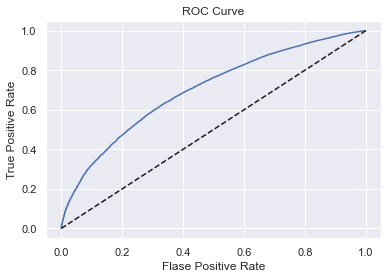

In [203]:
plt.plot(fpr,tpr)
plt.plot(fpr,fpr,linestyle='--',color='k')
plt.xlabel('Flase Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')

In [204]:
AUCROC=roc_auc_score(y_test_y_prob['y_test'],y_test_y_prob['y_pred_prob'])

In [205]:
AUCROC

0.700345755279211

# Gini and Kolmogorov-Smirnov

In [206]:
y_test_y_prob=y_test_y_prob.sort_values('y_pred_prob')

In [207]:
y_test_y_prob.head()

,y_test,y_pred_prob,y_pred
42341,1,0.378972,0
41663,1,0.433333,0
42209,1,0.448107,0
42344,1,0.457630,0
40518,0,0.461986,0


In [208]:
y_test_y_prob.tail()

,y_test,y_pred_prob,y_pred
234509,1,0.991529,1
239228,1,0.991603,1
258273,1,0.991613,1
242624,1,0.991865,1
262480,1,0.992067,1


In [209]:
y_test_y_prob=y_test_y_prob.reset_index()

In [210]:
y_test_y_prob.head()

,index,y_test,y_pred_prob,y_pred
0,42341,1,0.378972,0
1,41663,1,0.433333,0
2,42209,1,0.448107,0
3,42344,1,0.457630,0
4,40518,0,0.461986,0


In [211]:
y_test_y_prob['Cumulative Population']=y_test_y_prob.index + 1
y_test_y_prob['Cumulative Non-Defaulters']=y_test_y_prob['y_test'].cumsum()
y_test_y_prob['Cumulative Defaulters']=y_test_y_prob['Cumulative Population']-y_test_y_prob['Cumulative Non-Defaulters']

In [212]:
y_test_y_prob.head()

,index,y_test,y_pred_prob,y_pred,Cumulative Population,Cumulative Non-Defaulters,Cumulative Defaulters
0,42341,1,0.378972,0,1,1,0
1,41663,1,0.433333,0,2,2,0
2,42209,1,0.448107,0,3,3,0
3,42344,1,0.457630,0,4,4,0
4,40518,0,0.461986,0,5,4,1


In [213]:
y_test_y_prob['Cumulative Prop Population']=y_test_y_prob['Cumulative Population']/y_test_y_prob.shape[0]
y_test_y_prob['Cumulative Prop Non-Defaulters']=y_test_y_prob['Cumulative Non-Defaulters']/y_test_y_prob['y_test'].sum()
y_test_y_prob['Cumulative Prop Defaulters']=y_test_y_prob['Cumulative Defaulters']/(y_test_y_prob.shape[0]-y_test_y_prob['y_test'].sum())

In [214]:
y_test_y_prob.head()

,index,y_test,y_pred_prob,y_pred,Cumulative Population,Cumulative Non-Defaulters,Cumulative Defaulters,Cumulative Prop Population,Cumulative Prop Non-Defaulters,Cumulative Prop Defaulters
0,42341,1,0.378972,0,1,1,0,0.000011,0.000012,0.000000
1,41663,1,0.433333,0,2,2,0,0.000021,0.000024,0.000000
2,42209,1,0.448107,0,3,3,0,0.000032,0.000036,0.000000
3,42344,1,0.457630,0,4,4,0,0.000043,0.000048,0.000000
4,40518,0,0.461986,0,5,4,1,0.000054,0.000048,0.000098


In [215]:
y_test_y_prob.tail()

,index,y_test,y_pred_prob,y_pred,Cumulative Population,Cumulative Non-Defaulters,Cumulative Defaulters,Cumulative Prop Population,Cumulative Prop Non-Defaulters,Cumulative Prop Defaulters
93252,234509,1,0.991529,1,93253,83063,10190,0.999957,0.999952,1.0
93253,239228,1,0.991603,1,93254,83064,10190,0.999968,0.999964,1.0
93254,258273,1,0.991613,1,93255,83065,10190,0.999979,0.999976,1.0
93255,242624,1,0.991865,1,93256,83066,10190,0.999989,0.999988,1.0
93256,262480,1,0.992067,1,93257,83067,10190,1.000000,1.000000,1.0


Text(0.5, 1.0, 'Gini')

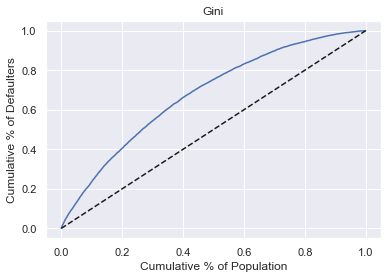

In [216]:
# gini
plt.plot(y_test_y_prob['Cumulative Prop Population'],y_test_y_prob['Cumulative Prop Defaulters'])
plt.plot(y_test_y_prob['Cumulative Prop Population'],y_test_y_prob['Cumulative Prop Population'],linestyle='--',color='k')
plt.xlabel('Cumulative % of Population')
plt.ylabel('Cumulative % of Defaulters')
plt.title('Gini')

In [217]:
gini=2*AUCROC-1
gini

0.4006915105584219

Text(0.5, 1.0, 'Kolmogorov-Smirnov')

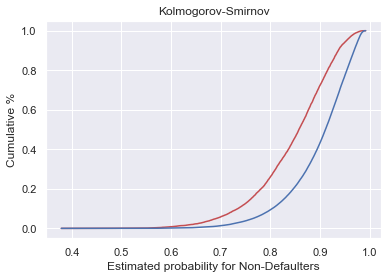

In [218]:
# K-S 
plt.plot(y_test_y_prob['y_pred_prob'],y_test_y_prob['Cumulative Prop Defaulters'],color='r')
plt.plot(y_test_y_prob['y_pred_prob'],y_test_y_prob['Cumulative Prop Non-Defaulters'],color='b')
plt.xlabel('Estimated probability for Non-Defaulters')
plt.ylabel('Cumulative %')
plt.title('Kolmogorov-Smirnov')

In [219]:
KS=max(y_test_y_prob['Cumulative Prop Defaulters']-y_test_y_prob['Cumulative Prop Non-Defaulters'])
KS

0.2947933146839753

# Creating a ScoreCard

In [220]:
re_cat

['grade:G',
 'homeOwnership_Rent_Other_Any_None',
 'addr_state:ND_NE_IA_NV_FL_HI_AL',
 'verification_status:Verified',
 'initial_list_status:f',
 'term:60',
 'emp_length:0',
 'months_since_issue_date:>85',
 'int_rate:>20.281',
 'annual_inc:<20000',
 'dti:>35',
 'mths_since_last_delinq:0-3',
 'mths_since_last_record:0-2',
 'purpose:educ__sm_b__wedd__ren_en__mov__house',
 'delinq_2yrs:>4',
 'inq_last_6mths:>6',
 'open_acc:0',
 'pub_rec:0',
 'total_acc:10-27',
 'acc_now_delinq:0',
 'months_since_credit_Cr_line:<140',
 'total_rev_hi_lim:<=4k']

In [221]:
df_ref_categories=pd.DataFrame(re_cat,columns=['Feature name'])
df_ref_categories['Coefficients']=0 #because ref category is our reference

In [222]:
df_scorecard=pd.concat([summary_table,df_ref_categories],axis=0)
df_scorecard=df_scorecard.reset_index()
df_scorecard

,index,Feature name,Coefficients
0,0,Intercept,-1.234487
1,1,grade:A,1.149831
2,2,grade:B,0.921123
3,3,grade:C,0.720970
4,4,grade:D,0.527452
5,5,grade:E,0.346456
6,6,grade:F,0.151655
7,7,home_ownership:OWN,0.103655
8,8,home_ownership:MORTGAGE,0.119488
9,9,addr_state:NM_VA,-0.036406


In [223]:
df_scorecard['Original Feature Name']=df_scorecard['Feature name'].str.split(':').str[0]
df_scorecard

,index,Feature name,Coefficients,Original Feature Name
0,0,Intercept,-1.234487,Intercept
1,1,grade:A,1.149831,grade
2,2,grade:B,0.921123,grade
3,3,grade:C,0.720970,grade
4,4,grade:D,0.527452,grade
5,5,grade:E,0.346456,grade
6,6,grade:F,0.151655,grade
7,7,home_ownership:OWN,0.103655,home_ownership
8,8,home_ownership:MORTGAGE,0.119488,home_ownership
9,9,addr_state:NM_VA,-0.036406,addr_state


In [100]:
min_score=300
max_score=900

In [226]:
df_scorecard.groupby('Original Feature Name')['Coefficients'].min()

Original Feature Name
Intercept                           -1.234487
acc_now_delinq                       0.000000
addr_state                          -0.036406
annual_inc                          -0.061538
delinq_2yrs                          0.000000
dti                                  0.000000
emp_length                           0.000000
grade                                0.000000
homeOwnership_Rent_Other_Any_None    0.000000
home_ownership                       0.103655
initial_list_status                  0.000000
inq_last_6mths                       0.000000
int_rate                             0.000000
months_since_credit_Cr_line          0.000000
months_since_issue_date             -0.070103
mths_since_last_delinq               0.000000
mths_since_last_record               0.000000
open_acc                            -0.221120
pub_rec                              0.000000
purpose                              0.000000
term                                 0.000000
total_acc   

In [227]:
min_sum_coef=df_scorecard.groupby('Original Feature Name')['Coefficients'].min().sum()
max_sum_coef=df_scorecard.groupby('Original Feature Name')['Coefficients'].max().sum()

In [228]:
min_sum_coef,max_sum_coef

(-1.6296009954083703, 6.128626542935338)

In [229]:
df_scorecard['Score Calculation']=df_scorecard['Coefficients']*(max_score-min_score)/(max_sum_coef-min_sum_coef)

In [230]:
pd.options.display.max_rows=None
df_scorecard

,index,Feature name,Coefficients,Original Feature Name,Score Calculation
0,0,Intercept,-1.234487,Intercept,-95.471830
1,1,grade:A,1.149831,grade,88.924737
2,2,grade:B,0.921123,grade,71.237158
3,3,grade:C,0.720970,grade,55.757854
4,4,grade:D,0.527452,grade,40.791699
5,5,grade:E,0.346456,grade,26.793956
6,6,grade:F,0.151655,grade,11.728605
7,7,home_ownership:OWN,0.103655,home_ownership,8.016390
8,8,home_ownership:MORTGAGE,0.119488,home_ownership,9.240897
9,9,addr_state:NM_VA,-0.036406,addr_state,-2.815559


In [231]:
df_scorecard['Score Calculation'][0]=((df_scorecard['Coefficients'][0]-min_sum_coef)/(max_sum_coef-min_sum_coef))*(max_score-min_score)++min_score


c:\users\rhitc\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [232]:
df_scorecard['Score-Prelim']=round(df_scorecard['Score Calculation'])

In [233]:
df_scorecard.groupby('Original Feature Name')['Score-Prelim'].min().sum()

300.0

In [245]:
df_scorecard.groupby('Original Feature Name')['Score-Prelim'].max().sum() #it should be 900...

902.0

In [246]:
df_scorecard['difference']=(df_scorecard['Score-Prelim']-df_scorecard['Score Calculation'])

In [247]:
df_scorecard.head()

,index,Feature name,Coefficients,Original Feature Name,Score Calculation,Score-Prelim,difference
0,0,Intercept,-1.234487,Intercept,330.557033,331.0,0.442967
1,1,grade:A,1.149831,grade,88.924737,89.0,0.075263
2,2,grade:B,0.921123,grade,71.237158,71.0,-0.237158
3,3,grade:C,0.720970,grade,55.757854,56.0,0.242146
4,4,grade:D,0.527452,grade,40.791699,41.0,0.208301


In [244]:
df_scorecard.groupby('Original Feature Name')['Score-Prelim'].max()

Original Feature Name
Intercept                            331.0
acc_now_delinq                        15.0
addr_state                            36.0
annual_inc                            46.0
delinq_2yrs                           17.0
dti                                   28.0
emp_length                            10.0
grade                                 89.0
homeOwnership_Rent_Other_Any_None      0.0
home_ownership                         9.0
initial_list_status                    4.0
inq_last_6mths                        46.0
int_rate                              70.0
months_since_credit_Cr_line            8.0
months_since_issue_date               83.0
mths_since_last_delinq                11.0
mths_since_last_record                32.0
open_acc                               0.0
pub_rec                               30.0
purpose                                5.0
term                                   6.0
total_acc                              6.0
total_rev_hi_lim                

In [248]:
pd.options.display.max_rows=None
df_scorecard

,index,Feature name,Coefficients,Original Feature Name,Score Calculation,Score-Prelim,difference
0,0,Intercept,-1.234487,Intercept,330.557033,331.0,0.442967
1,1,grade:A,1.149831,grade,88.924737,89.0,0.075263
2,2,grade:B,0.921123,grade,71.237158,71.0,-0.237158
3,3,grade:C,0.720970,grade,55.757854,56.0,0.242146
4,4,grade:D,0.527452,grade,40.791699,41.0,0.208301
5,5,grade:E,0.346456,grade,26.793956,27.0,0.206044
6,6,grade:F,0.151655,grade,11.728605,12.0,0.271395
7,7,home_ownership:OWN,0.103655,home_ownership,8.016390,8.0,-0.016390
8,8,home_ownership:MORTGAGE,0.119488,home_ownership,9.240897,9.0,-0.240897
9,9,addr_state:NM_VA,-0.036406,addr_state,-2.815559,-3.0,-0.184441


In [249]:
df_scorecard['Final score']=df_scorecard['Score-Prelim']
df_scorecard['Final score'][0]=329

c:\users\rhitc\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [250]:
df_scorecard.groupby('Original Feature Name')['Final score'].max().sum()

900.0

In [251]:
df_scorecard

,index,Feature name,Coefficients,Original Feature Name,Score Calculation,Score-Prelim,difference,Final score
0,0,Intercept,-1.234487,Intercept,330.557033,331.0,0.442967,329.0
1,1,grade:A,1.149831,grade,88.924737,89.0,0.075263,89.0
2,2,grade:B,0.921123,grade,71.237158,71.0,-0.237158,71.0
3,3,grade:C,0.720970,grade,55.757854,56.0,0.242146,56.0
4,4,grade:D,0.527452,grade,40.791699,41.0,0.208301,41.0
5,5,grade:E,0.346456,grade,26.793956,27.0,0.206044,27.0
6,6,grade:F,0.151655,grade,11.728605,12.0,0.271395,12.0
7,7,home_ownership:OWN,0.103655,home_ownership,8.016390,8.0,-0.016390,8.0
8,8,home_ownership:MORTGAGE,0.119488,home_ownership,9.240897,9.0,-0.240897,9.0
9,9,addr_state:NM_VA,-0.036406,addr_state,-2.815559,-3.0,-0.184441,-3.0


# Calculating Credit Score

In [165]:
pd.options.display.max_columns=None
input_test_with_ref_cat.head()

,Intercept,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,homeOwnership_Rent_Other_Any_None,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:UT_KY_AZ_NJ,addr_state:RI_MA_DE_SD_IN,addr_state:WI_MT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:AR_MI_PA_OH_MN,addr_state:GA_WA_OR,addr_state:OK_TN_MO_LA_MD_NC,addr_state:IL_CT,addr_state:WV_NH_WY_DC_ME_ID,term:36,term:60,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,months_since_issue_date:<38,months_since_issue_date:38-39,months_since_issue_date:40-41,months_since_issue_date:42-48,months_since_issue_date:49-52,months_since_issue_date:53-64,months_since_issue_date:65-84,months_since_issue_date:>85,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,int_rate:>20.281,annual_inc:<20000,annual_inc:20k-30k,annual_inc:30k-40k,annual_inc:40k-50k,annual_inc:50k-60k,annual_inc:60k-70k,annual_inc:70k-80k,annual_inc:80k-90k,annual_inc:90k-100k,annual_inc:100k-120k,annual_inc:120k-140k,annual_inc:>140k,mths_since_last_delinq:Null,mths_since_last_delinq:0-3,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,dti:<1.4,dti:1.4-3.5,dti:3.5-7.7,dti:7.7-10.5,dti:10.5-16.1,dti:16.1-20.3,dti:20.3-21.7,dti:21.7-22.4,dti:22.4-35,dti:>35,mths_since_last_record:Null,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=87,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,initial_list_status:f,initial_list_status:w,purpose:educ__sm_b__wedd__ren_en__mov__house,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,delinq_2yrs:<=0.96,delinq_2yrs:0.96-1.98,delinq_2yrs:1.98-2.94,delinq_2yrs:2.94-4,delinq_2yrs:>4,inq_last_6mths:<=0.96,inq_last_6mths:0.96-1.92,inq_last_6mths:1.92-2.88,inq_last_6mths:2.88-3.96,inq_last_6mths:3.96-4.92,inq_last_6mths:4.92-6,inq_last_6mths:>6,purpose:educ__sm_b__wedd__ren_en__mov__house,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,delinq_2yrs:<=0.96,delinq_2yrs:0.96-1.98,delinq_2yrs:1.98-2.94,delinq_2yrs:2.94-4,delinq_2yrs:>4,inq_last_6mths:<=0.96,inq_last_6mths:0.96-1.92,inq_last_6mths:1.92-2.88,inq_last_6mths:2.88-3.96,inq_last_6mths:3.96-4.92,inq_last_6mths:4.92-6,inq_last_6mths:>6,open_acc:0,open_acc:1-3,open_acc:4-11,open_acc:12-23,open_acc:>23,pub_rec:0,pub_rec:1,pub_rec:2,pub_rec:3,pub_rec:>3,total_acc:0,total_acc:1-9,total_acc:10-27,total_acc:27-54,total_acc:>55,acc_now_delinq:0,acc_now_delinq:>=1,months_since_credit_Cr_line:<140,months_since_credit_Cr_line:140-300,months_since_credit_Cr_line:>300,total_rev_hi_lim:<=4k,total_rev_hi_lim:4k-35k,total_rev_hi_lim:35k-56k,total_rev_hi_lim:56k-80k,total_rev_hi_lim:>80k
362514,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0
288564,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0
213591,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0
263083,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,0,0
165001,1,1,0,0,0,0,0

In [252]:
input_test_with_ref_cat.columns.values

array(['grade:A', 'grade:B', 'grade:C', 'grade:D', 'grade:E', 'grade:F',
       'grade:G', 'homeOwnership_Rent_Other_Any_None',
       'home_ownership:OWN', 'home_ownership:MORTGAGE',
       'addr_state:ND_NE_IA_NV_FL_HI_AL', 'addr_state:NM_VA',
       'addr_state:UT_KY_AZ_NJ', 'addr_state:RI_MA_DE_SD_IN',
       'addr_state:WI_MT', 'addr_state:KS_SC_CO_VT_AK_MS',
       'addr_state:AR_MI_PA_OH_MN', 'addr_state:GA_WA_OR',
       'addr_state:OK_TN_MO_LA_MD_NC', 'addr_state:IL_CT',
       'addr_state:WV_NH_WY_DC_ME_ID', 'term:36', 'term:60',
       'emp_length:0', 'emp_length:1', 'emp_length:2-4', 'emp_length:5-6',
       'emp_length:7-9', 'emp_length:10', 'months_since_issue_date:<38',
       'months_since_issue_date:38-39', 'months_since_issue_date:40-41',
       'months_since_issue_date:42-48', 'months_since_issue_date:49-52',
       'months_since_issue_date:53-64', 'months_since_issue_date:65-84',
       'months_since_issue_date:>85', 'int_rate:<9.548',
       'int_rate:9.548-12.025'

In [152]:
df_scorecard.head()

,index,Feature name,Coefficients,Original Feature Name,Score Calculation,Score-Prelim,difference,Final score
0,0,Intercept,-1.036412,Intercept,330.563102,331.0,0.436898,330.0
1,1,grade:A,1.172004,grade,98.973995,99.0,0.026005,99.0
2,2,grade:B,0.910433,grade,76.884700,77.0,0.115300,77.0
3,3,grade:C,0.705619,grade,59.588464,60.0,0.411536,60.0
4,4,grade:D,0.508905,grade,42.976295,43.0,0.023705,43.0


In [253]:
del inputs_test_with_intercept

In [254]:
inputs_test_with_intercept=input_test_with_ref_cat

In [255]:
inputs_test_with_intercept.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,homeOwnership_Rent_Other_Any_None,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:UT_KY_AZ_NJ,addr_state:RI_MA_DE_SD_IN,addr_state:WI_MT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:AR_MI_PA_OH_MN,addr_state:GA_WA_OR,addr_state:OK_TN_MO_LA_MD_NC,addr_state:IL_CT,addr_state:WV_NH_WY_DC_ME_ID,term:36,term:60,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,months_since_issue_date:<38,months_since_issue_date:38-39,months_since_issue_date:40-41,months_since_issue_date:42-48,months_since_issue_date:49-52,months_since_issue_date:53-64,months_since_issue_date:65-84,months_since_issue_date:>85,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,int_rate:>20.281,annual_inc:<20000,annual_inc:20k-30k,annual_inc:30k-40k,annual_inc:40k-50k,annual_inc:50k-60k,annual_inc:60k-70k,annual_inc:70k-80k,annual_inc:80k-90k,annual_inc:90k-100k,annual_inc:100k-120k,annual_inc:120k-140k,annual_inc:>140k,mths_since_last_delinq:Null,mths_since_last_delinq:0-3,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,dti:<1.4,dti:1.4-3.5,dti:3.5-7.7,dti:7.7-10.5,dti:10.5-16.1,dti:16.1-20.3,dti:20.3-21.7,dti:21.7-22.4,dti:22.4-35,dti:>35,mths_since_last_record:Null,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=87,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,initial_list_status:f,initial_list_status:w,purpose:educ__sm_b__wedd__ren_en__mov__house,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,delinq_2yrs:<=0.96,delinq_2yrs:0.96-1.98,delinq_2yrs:1.98-2.94,delinq_2yrs:2.94-4,delinq_2yrs:>4,inq_last_6mths:<=0.96,inq_last_6mths:0.96-1.92,inq_last_6mths:1.92-2.88,inq_last_6mths:2.88-3.96,inq_last_6mths:3.96-4.92,inq_last_6mths:4.92-6,inq_last_6mths:>6,open_acc:0,open_acc:1-3,open_acc:4-11,open_acc:12-23,open_acc:>23,pub_rec:0,pub_rec:1,pub_rec:2,pub_rec:3,pub_rec:>3,total_acc:0,total_acc:1-9,total_acc:10-27,total_acc:27-54,total_acc:>55,acc_now_delinq:0,acc_now_delinq:>=1,months_since_credit_Cr_line:<140,months_since_credit_Cr_line:140-300,months_since_credit_Cr_line:>300,total_rev_hi_lim:<=4k,total_rev_hi_lim:4k-35k,total_rev_hi_lim:35k-56k,total_rev_hi_lim:56k-80k,total_rev_hi_lim:>80k
362514,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0
288564,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0
213591,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0
263083,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,0,0
165001,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0


In [256]:
inputs_test_with_intercept.insert(0,'Intercept',1)

In [257]:
inputs_test_with_intercept.head()

,Intercept,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,homeOwnership_Rent_Other_Any_None,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:UT_KY_AZ_NJ,addr_state:RI_MA_DE_SD_IN,addr_state:WI_MT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:AR_MI_PA_OH_MN,addr_state:GA_WA_OR,addr_state:OK_TN_MO_LA_MD_NC,addr_state:IL_CT,addr_state:WV_NH_WY_DC_ME_ID,term:36,term:60,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,months_since_issue_date:<38,months_since_issue_date:38-39,months_since_issue_date:40-41,months_since_issue_date:42-48,months_since_issue_date:49-52,months_since_issue_date:53-64,months_since_issue_date:65-84,months_since_issue_date:>85,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,int_rate:>20.281,annual_inc:<20000,annual_inc:20k-30k,annual_inc:30k-40k,annual_inc:40k-50k,annual_inc:50k-60k,annual_inc:60k-70k,annual_inc:70k-80k,annual_inc:80k-90k,annual_inc:90k-100k,annual_inc:100k-120k,annual_inc:120k-140k,annual_inc:>140k,mths_since_last_delinq:Null,mths_since_last_delinq:0-3,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,dti:<1.4,dti:1.4-3.5,dti:3.5-7.7,dti:7.7-10.5,dti:10.5-16.1,dti:16.1-20.3,dti:20.3-21.7,dti:21.7-22.4,dti:22.4-35,dti:>35,mths_since_last_record:Null,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=87,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,initial_list_status:f,initial_list_status:w,purpose:educ__sm_b__wedd__ren_en__mov__house,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,delinq_2yrs:<=0.96,delinq_2yrs:0.96-1.98,delinq_2yrs:1.98-2.94,delinq_2yrs:2.94-4,delinq_2yrs:>4,inq_last_6mths:<=0.96,inq_last_6mths:0.96-1.92,inq_last_6mths:1.92-2.88,inq_last_6mths:2.88-3.96,inq_last_6mths:3.96-4.92,inq_last_6mths:4.92-6,inq_last_6mths:>6,open_acc:0,open_acc:1-3,open_acc:4-11,open_acc:12-23,open_acc:>23,pub_rec:0,pub_rec:1,pub_rec:2,pub_rec:3,pub_rec:>3,total_acc:0,total_acc:1-9,total_acc:10-27,total_acc:27-54,total_acc:>55,acc_now_delinq:0,acc_now_delinq:>=1,months_since_credit_Cr_line:<140,months_since_credit_Cr_line:140-300,months_since_credit_Cr_line:>300,total_rev_hi_lim:<=4k,total_rev_hi_lim:4k-35k,total_rev_hi_lim:35k-56k,total_rev_hi_lim:56k-80k,total_rev_hi_lim:>80k
362514,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0
288564,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0
213591,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0
263083,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,0,0
165001,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0


In [157]:
#inputs_test_with_intercept = inputs_test_with_intercept.loc[:,~inputs_test_with_intercept.columns.duplicated()]

(122, 8)

In [259]:
## Ordering column name in same order with feature name in Scorecard
inputs_test_with_intercept=inputs_test_with_intercept.loc[:,df_scorecard['Feature name'].values]

In [265]:
inputs_test_with_intercept.shape

(93257, 122)

In [266]:
df_scorecard.shape

(122, 8)

In [261]:
scorecard_score=df_scorecard['Final score']

# Calculating Credit Score

In [267]:
scorecard_score.shape

(122,)

In [274]:
scorecard_score=scorecard_score.values.reshape(122,1)

In [275]:
scorecard_score.shape

(122, 1)

In [277]:
y_scores=inputs_test_with_intercept.dot(scorecard_score)

In [278]:
y_scores.head()

,0
362514,621.0
288564,552.0
213591,586.0
263083,635.0
165001,692.0


In [280]:
sum_coef_from_score=((y_scores-min_score)/(max_score-min_score))*(max_sum_coef-min_sum_coef)+min_sum_coef

In [287]:
y_hat_prob_from_score=np.exp(sum_coef_from_score)/(1+np.exp(sum_coef_from_score))

In [288]:
y_hat_prob_from_score.head()

,0
362514,0.925604
288564,0.836013
213591,0.887802
263083,0.937149
165001,0.968905


In [294]:
prob_non_default[:5]   ## not exactly exact numbers because of rounding off

array([0.92611498, 0.83870996, 0.8892987 , 0.93903222, 0.96888526])

## Setting Cut-Off

In [295]:
from sklearn.metrics import roc_curve

In [296]:
fpr,tpr,th=roc_curve(y_test_y_prob['y_test'],y_test_y_prob['y_pred_prob'])

In [305]:
df_cutoff=pd.concat([pd.DataFrame(th),pd.DataFrame(fpr),pd.DataFrame(tpr)],axis=1)
df_cutoff.columns=['Threshold','FPR','TPR']
df_cutoff.head()

,Threshold,FPR,TPR
0,1.992067,0.000000,0.000000
1,0.992067,0.000000,0.000012
2,0.990457,0.000000,0.000193
3,0.990433,0.000098,0.000193
4,0.988427,0.000098,0.001372


first threshold has unexpected large values.. we can fix it to be as close to 1

In [306]:
df_cutoff['Threshold'][0]=1/1+np.power(10,12)

In [307]:
df_cutoff.head()

,Threshold,FPR,TPR
0,-7.273800e+08,0.000000,0.000000
1,9.920672e-01,0.000000,0.000012
2,9.904572e-01,0.000000,0.000193
3,9.904329e-01,0.000098,0.000193
4,9.884274e-01,0.000098,0.001372


In [308]:
#Scoring the Threshold
df_cutoff['Score']=(np.log(df_cutoff['Threshold']/(1+df_cutoff['Threshold']))-min_sum_coef)*((max_score-min_score)/(max_sum_coef-min_sum_coef))+min_score

In [309]:
df_cutoff.head()

,Threshold,FPR,TPR,Score
0,-7.273800e+08,0.000000,0.000000,426.028863
1,9.920672e-01,0.000000,0.000012,372.114179
2,9.904572e-01,0.000000,0.000193,372.051097
3,9.904329e-01,0.000098,0.000193,372.050144
4,9.884274e-01,0.000098,0.001372,371.971351


In [311]:
df_cutoff.tail()

,Threshold,FPR,TPR,Score
17444,0.484047,0.999607,0.999940,339.384339
17445,0.480641,0.999706,0.999940,339.015964
17446,0.476749,0.999706,0.999952,338.590782
17447,0.461986,1.000000,0.999952,336.935096
17448,0.378972,1.000000,1.000000,326.137631


In [319]:
def no_approved(p):
    return np.where(y_test_y_prob['y_pred_prob']>=p,1,0).sum()

In [320]:
df_cutoff['#_approved']=df_cutoff['Threshold'].apply(no_approved)
df_cutoff['#_rejected']=y_test_y_prob['y_pred_prob'].shape[0]-df_cutoff['#_approved']
df_cutoff['Approval Rate']=df_cutoff['#_approved']/y_test_y_prob['y_pred_prob'].shape[0]
df_cutoff['Rejection Rate']=1-df_cutoff['Approval Rate']

In [323]:
pd.options.display.max_rows=None
df_cutoff

,Threshold,FPR,TPR,Score,#_approved,#_rejected,Approval Rate,Rejection Rate
0,-7.273800e+08,0.000000,0.000000,426.028863,93257,0,1.000000,0.000000
1,9.920672e-01,0.000000,0.000012,372.114179,1,93256,0.000011,0.999989
2,9.904572e-01,0.000000,0.000193,372.051097,16,93241,0.000172,0.999828
3,9.904329e-01,0.000098,0.000193,372.050144,17,93240,0.000182,0.999818
4,9.884274e-01,0.000098,0.001372,371.971351,115,93142,0.001233,0.998767
5,9.883990e-01,0.000196,0.001372,371.970231,116,93141,0.001244,0.998756
6,9.874277e-01,0.000196,0.002612,371.931983,219,93038,0.002348,0.997652
7,9.874272e-01,0.000294,0.002612,371.931961,220,93037,0.002359,0.997641
8,9.854268e-01,0.000294,0.006910,371.853007,577,92680,0.006187,0.993813
9,9.854265e-01,0.000393,0.006910,371.852996,578,92679,0.006198,0.993802


Assume, Highest level of Probability of Default we would assume is say 10% i.e lowest level of probability of Non-Defaulters is 90%... then Approval rate is 53.60% and Rejection Rate is 46.40% as shown below

In [327]:
#...
df_cutoff.iloc[5351,:]

Threshold             0.900051
FPR                   0.276742
TPR                   0.567759
Score               368.243669
#_approved        49982.000000
#_rejected        43275.000000
Approval Rate         0.535960
Rejection Rate        0.464040
Name: 5351, dtype: float64

In [330]:
input_train_with_ref_cat.to_csv('input_train_with_ref_cat.csv')

In [329]:
df_scorecard.to_csv('df_scorecard.csv')

In [ ]:
input_test_with_ref_cat.to_csv('input_test_with_ref_cat.csv')